## Preliminary exploratory data analysis


In [1]:
library(tidyverse)
library(dplyr)
library(tidymodels)
options(repr.matrix.max.rows = 6)


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

In [2]:
growth_data = read_csv("GrowthStatus Dataset.csv") 
colnames(growth_data) <- c('Age_Months','Sex','Height_cm', 'Nutritional_Status')
write_csv(growth_data,"GrowthStatus Dataset.csv")

Rows: 120999 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): Sex, Nutritional_Status
dbl (2): Age_Months, Height_cm

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


We Subset the data pertaining to females and Store it in GrowthStatusFemale Dataset.csv.

In [3]:
growth_data_female = growth_data |>
                        filter(Sex == "Female") |>
                        mutate(Nutritional_Status = as_factor(Nutritional_Status))

growth_data_female

write_csv(growth_data_female,"GrowthStatusFemale Dataset.csv")

Age_Months,Sex,Height_cm,Nutritional_Status
<dbl>,<chr>,<dbl>,<fct>
0,Female,42.19578,severely stunted
0,Female,54.81734,Tall
0,Female,43.70211,stunted
⋮,⋮,⋮,⋮
60,Female,121.3,normal
60,Female,112.2,normal
60,Female,109.8,normal


In [4]:
set.seed(3456) 
growth_data_fem_split <- initial_split(growth_data_female, prop = 0.70, strata = Nutritional_Status)  

growth_data_fem_split

<Training/Testing/Total>
<42700/18302/61002>

In [5]:
growth_data_fem_train <- training(growth_data_fem_split)
growth_data_fem_test <- testing(growth_data_fem_split)

In [6]:
#Structure of the training dataset obtained using the glimpse function.
glimpse(growth_data_fem_train)

Rows: 42,700
Columns: 4
$ Age_Months         <dbl> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, …
$ Sex                <chr> "Female", "Female", "Female", "Female", "Female", "…
$ Height_cm          <dbl> 52.18537, 51.34051, 53.84272, 53.44258, 53.95222, 4…
$ Nutritional_Status <fct> normal, normal, normal, normal, normal, normal, nor…


In [7]:
#Obtaining Distributions of the class to be predicted.
nutrition_proportions <- growth_data_fem_train |>
                      group_by(Nutritional_Status) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(growth_data_fem_train))


nutrition_proportions

Nutritional_Status,n,percent
<fct>,<int>,<dbl>
severely stunted,6646,15.56440
Tall,7104,16.63700
stunted,4904,11.48478
normal,24046,56.31382


In [8]:
#Standardizing the data.
growth_recipe <- recipe(Nutritional_Status ~ Height_cm + Age_Months, data = growth_data_fem_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors()) |> 
  prep()

In [9]:
#Preprocessing the data by scaling it.

scaled_growth_data_fem_train <- bake(growth_recipe, growth_data_fem_train)
scaled_growth_data_fem_train

Height_cm,Age_Months,Nutritional_Status
<dbl>,<dbl>,<fct>
-2.059893,-1.703672,normal
-2.108279,-1.703672,normal
-1.964975,-1.703672,normal
⋮,⋮,⋮
2.173269,1.70272,Tall
2.115998,1.70272,Tall
2.047273,1.70272,Tall


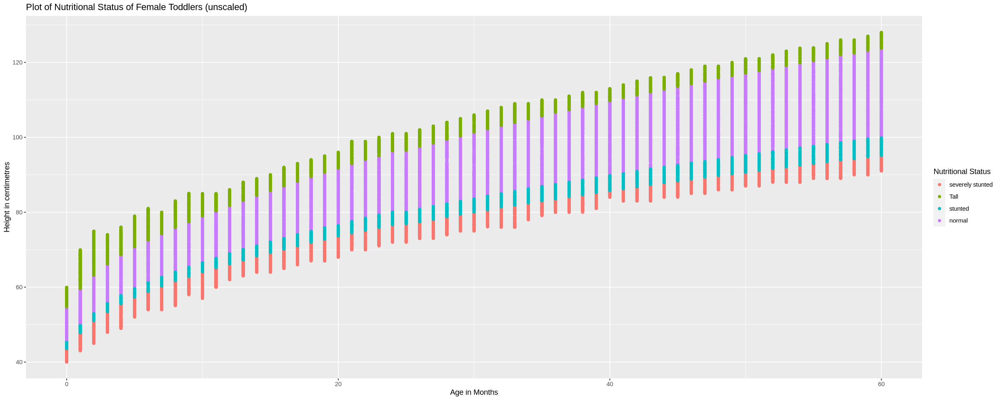

In [10]:
#Plot of the unscaled training data.
options(repr.plot.width = 20, repr.plot.height = 8)
unscaled_fem_growth_plot <- growth_data_fem_train|>
                            ggplot(aes(x = Age_Months, y= Height_cm, color= Nutritional_Status))+
                            geom_point() +
                            labs(x= "Age in Months", y= "Height in centimetres",color = "Nutritional Status")+
                            ggtitle("Plot of Nutritional Status of Female Toddlers (unscaled)")

unscaled_fem_growth_plot